# Canny Edge Detection Implementation

This notebook implements the Canny edge detection algorithm with step-by-step visualizations of the process.

## Import lib

In [79]:
import matplotlib.image as mpimg
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tqdm

## convolution functions

In [ ]:
def my_conv2d(kernel, img, conv_type="full"):
    """
    Implement 2D image convolution
    :param kernel: float/int array, shape: (x, x)
    :param img: float/int array, shape: (height, width)
    :param conv_type: str, convolution padding choices, should in ['full', 'same', 'valid']
    :return conv results, numpy array
    """
    # Get dimensions
    k_h, k_w = kernel.shape
    i_h, i_w = img.shape

    # Rotate kernel by 180 degrees for convolution
    kernel = np.rot90(kernel, 2)

    # Calculate output dimensions based on conv_type
    half_k_h = k_h // 2
    half_k_w = k_w // 2
    if conv_type == "full":
        pad_h = k_h - 1
        pad_w = k_w - 1
        out_h = i_h + pad_h - 1
        out_w = i_w + pad_w - 1
    elif conv_type == "same":
        pad_h = (k_h - 1) // 2
        pad_w = (k_w - 1) // 2
        out_h = i_h
        out_w = i_w
    elif conv_type == "valid":
        pad_h = pad_w = 0
        out_h = i_h - k_h + 1
        out_w = i_w - k_w + 1
    else:
        raise ValueError("conv_type must be 'full', 'same', or 'valid'")

    # Pad the image
    padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode="constant", constant_values=0)

    # Perform convolution
    result = np.zeros((out_h, out_w))
    for i in tqdm.tqdm(range(out_h)):
        for j in range(out_w):
            result[i, j] = np.sum(padded_img[i : i + k_h, j : j + k_w] * kernel)

    return result


def clip_show(img):
    max_val = np.percentile(img, 99)
    min_val = np.min(img)
    img = np.clip(img, min_val, max_val)
    img = (img - min_val) / (max_val - min_val) * 255
    return img.astype(np.uint8)


def plot_2_fig(
    origin_img,
    conv_img,
    title1,
    title2,
    cmap="gray",
    target_width=2000,
    target_height=1000,
    dpi=100,
):
    plt.figure(figsize=(target_width / dpi, target_height / dpi), dpi=dpi)

    # Plot original image
    plt.subplot(1, 2, 1)
    plt.imshow(origin_img, cmap=cmap)
    plt.title(title1)

    # Plot convolution result
    plt.subplot(1, 2, 2)
    plt.imshow(conv_img, cmap=cmap)
    plt.title(title2)

    plt.tight_layout()
    plt.show()


def generate_gaussian_kernel(size, sigma=1):
    """This function generates a 2D Gaussian kernel. And it output a 2D numpy array whose values are the Gaussian values between 0 and 1."""
    # generate an axis
    x = np.linspace(-size // 2, size // 2, size)
    gauss_x = np.exp(-(x**2) / (2 * sigma**2))

    # generate a 2D gaussian kernel and normalize
    gauss_2d = np.outer(gauss_x, gauss_x)
    gauss_2d /= gauss_2d.sum()
    return gauss_2d

## Load the Image

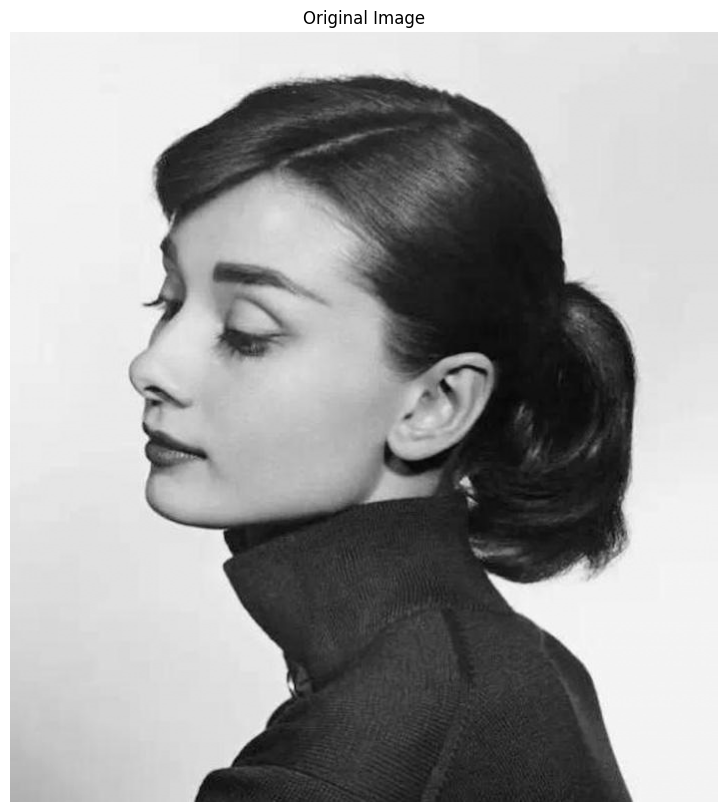

In [81]:
path = 'Hepburn.jpeg'
img = mpimg.imread(path)

plt.figure(figsize=(10, 10))
plt.imshow(img, cmap="gray")
plt.title("Original Image")
plt.axis("off")
plt.show()

## Implement Canny Edge Detection

The Canny edge detection algorithm consists of several steps:
1. Compute image gradients using Sobel operators
2. Calculate gradient magnitude and direction
3. Apply non-maximum suppression
4. Apply double thresholding and edge tracking

## Compute DOG

In [ ]:
size = 11
sigma = 0.5
gaussian_kernel = generate_gaussian_kernel(size, sigma)
derivative_x_kernel = np.array([[0, 0, 0], [1, 0, -1], [0, 0, 0]], dtype=np.float32) / 2.0
derivative_y_kernel = np.array([[0, 1, 0], [0, 0, 0], [0, -1, 0]], dtype=np.float32) / 2.0
derivative_x_gaussian_kernel = my_conv2d(derivative_x_kernel, generate_gaussian_kernel(size, sigma), conv_type="same")
derivative_y_gaussian_kernel = my_conv2d(derivative_x_kernel.T, generate_gaussian_kernel(size, sigma), conv_type="same")

print("gaussian_kernel:\n", gaussian_kernel)
print("derivative_x_kernel:\n", derivative_x_kernel)
print("derivative x:\n", derivative_x_gaussian_kernel)
print("derivative y:\n", derivative_y_gaussian_kernel)


# Perform convolution

derivative_x_result = my_conv2d(derivative_x_kernel, img, conv_type="same")
gaussian_result = my_conv2d(gaussian_kernel, img, conv_type="same")

derivative_x_gaussian_result = my_conv2d(
    derivative_x_gaussian_kernel, img, conv_type="same"
)

derivative_y_gaussian_result = my_conv2d(
    derivative_y_gaussian_kernel, img, conv_type="same"
)

100%|██████████| 11/11 [00:00<?, ?it/s]


gaussian_kernel:
 [[2.38208335e-63 6.18498469e-53 1.26979909e-44 2.06132326e-38
  2.64589072e-34 2.68542117e-32 2.15510097e-32 1.36753215e-34
  6.86154907e-39 2.72220928e-45 8.53956118e-54]
 [6.18498469e-53 1.60590668e-42 3.29698285e-34 5.35214388e-28
  6.86995003e-24 6.97258929e-22 5.59563398e-22 3.55074284e-24
  1.78157393e-28 7.06810815e-35 2.21726311e-43]
 [1.26979909e-44 3.29698285e-34 6.76882166e-26 1.09881395e-19
  1.41042489e-15 1.43149709e-13 1.14880332e-13 7.28979984e-16
  3.65763389e-20 1.45110744e-26 4.55211908e-35]
 [2.06132326e-38 5.35214388e-28 1.09881395e-19 1.78375521e-13
  2.28960757e-09 2.32381505e-07 1.86490526e-07 1.18338673e-09
  5.93760530e-14 2.35564944e-20 7.38966423e-29]
 [2.64589072e-34 6.86995003e-24 1.41042489e-15 2.28960757e-09
  2.93891383e-05 2.98282214e-03 2.39377084e-03 1.51898153e-05
  7.62144155e-10 3.02368440e-16 9.48528762e-25]
 [2.68542117e-32 6.97258929e-22 1.43149709e-13 2.32381505e-07
  2.98282214e-03 3.02738646e-01 2.42953455e-01 1.54167561e-0

100%|██████████| 772/772 [00:01<00:00, 434.85it/s]


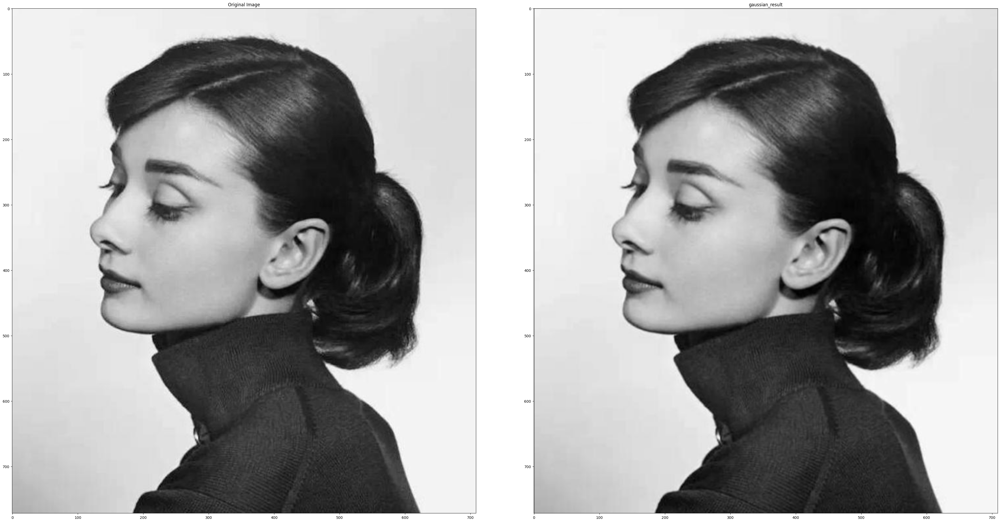

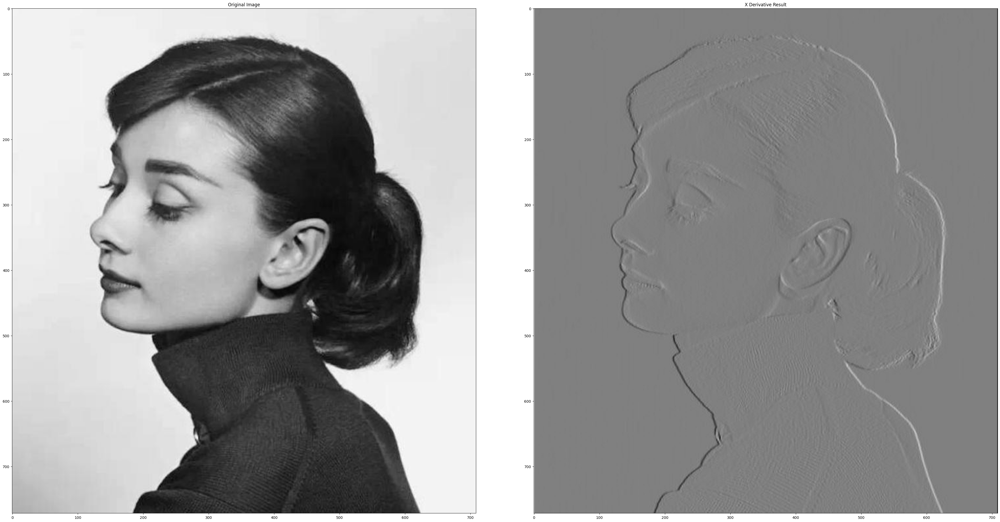

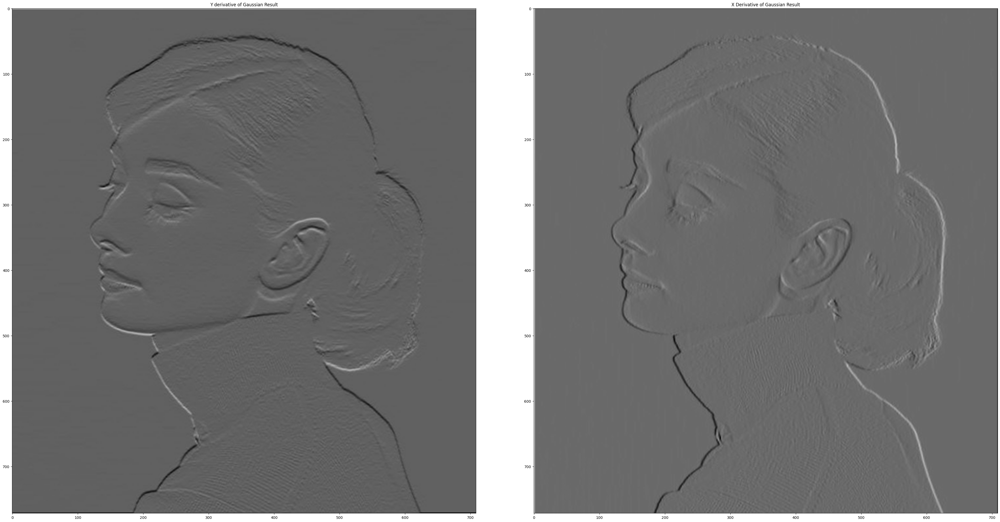

In [83]:
plot_2_fig(img, gaussian_result, "Original Image", "gaussian_result", "gray", 4000, 2000)

# Show original image and X derivative
plot_2_fig(img, derivative_x_result, "Original Image", "X Derivative Result", "gray", 4000, 2000)

# Show X and Y derivatives
plot_2_fig(derivative_y_gaussian_result, derivative_x_gaussian_result, "Y derivative of Gaussian Result", "X Derivative of Gaussian Result", "gray", 4000, 2000)

## Step 2: Calculate Gradient Magnitude and Direction

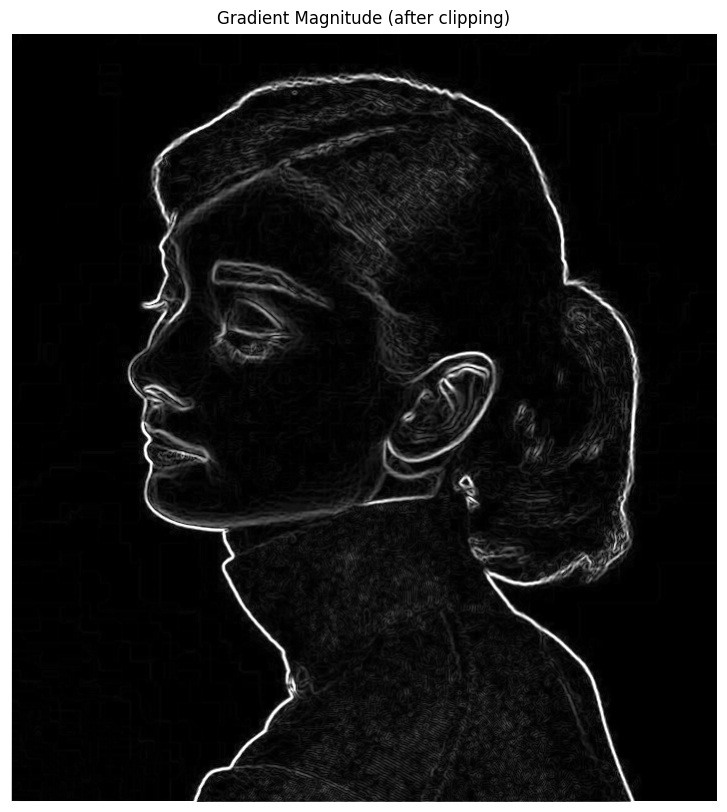

In [84]:
# Calculate gradient magnitude
gradient_magnitude = np.sqrt(
    derivative_x_gaussian_result**2 + derivative_y_gaussian_result**2
)

# Normalize gradient magnitude to [0, 255]
max_val = np.percentile(gradient_magnitude, 99)
min_val = np.min(gradient_magnitude)
gradient_magnitude = np.clip(gradient_magnitude, min_val, max_val)
gradient_magnitude = (gradient_magnitude - min_val) / (max_val - min_val) * 255

plt.figure(figsize=(10, 10))
plt.imshow(gradient_magnitude, cmap="gray")
plt.title("Gradient Magnitude (after clipping)")
plt.axis("off")
plt.show()

## Visualize Gradient Angles

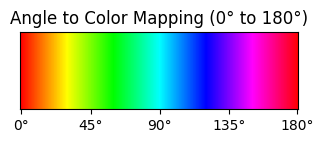

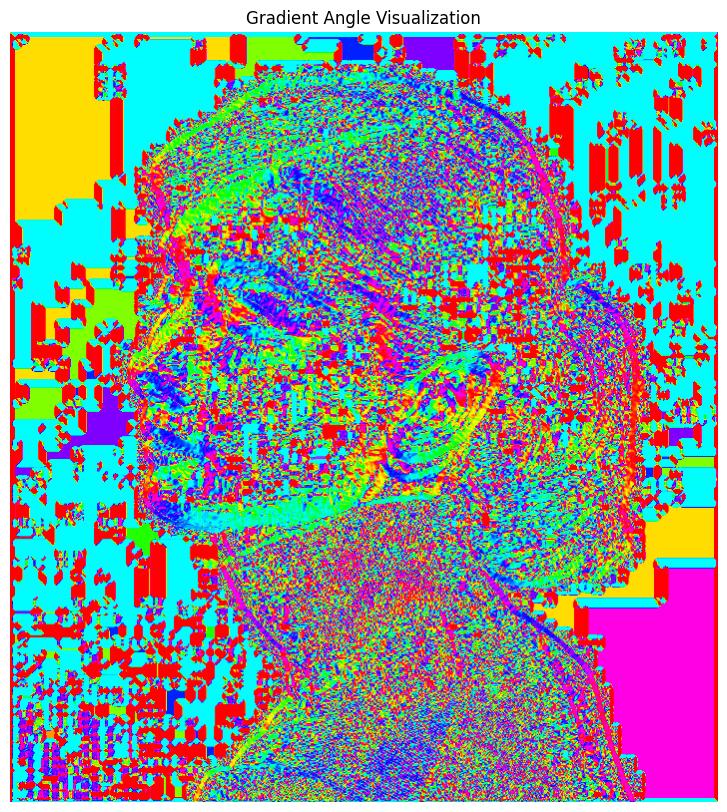

In [85]:
# Calculate gradient direction
gradient_angle = np.arctan2(
    derivative_y_gaussian_result, derivative_x_gaussian_result
)
gradient_angle = np.degrees(gradient_angle)
gradient_angle = gradient_angle % 180  # map to [0, 180]

# Create color mapping for angles
angle_board = np.linspace(0, 180, 180).reshape(1, -1)  # Create array from 0 to 180
angle_board = np.repeat(angle_board, 50, axis=0)  # Repeat to make it visible
color_board = np.zeros((*angle_board.shape, 3), dtype=np.uint8)
color_board[..., 0] = angle_board  # H channel (angle)
color_board[..., 1] = 255  # S channel (saturation)
color_board[..., 2] = 255  # V channel (value)
color_board = cv2.cvtColor(color_board, cv2.COLOR_HSV2RGB)

plt.figure(figsize=(45, 1))
plt.imshow(color_board)
plt.title("Angle to Color Mapping (0° to 180°)")
plt.xticks([0, 45, 90, 135, 179], ["0°", "45°", "90°", "135°", "180°"])
plt.yticks([])
plt.show()

gradient_angle_color = np.zeros((*gradient_angle.shape, 3), dtype=np.uint8)
gradient_angle_color[..., 0] = gradient_angle
gradient_angle_color[..., 1] = 255
gradient_angle_color[..., 2] = 255

gradient_angle_color = cv2.cvtColor(gradient_angle_color, cv2.COLOR_HSV2RGB)

plt.figure(figsize=(10, 10))
plt.imshow(gradient_angle_color)
plt.title("Gradient Angle Visualization")
plt.axis("off")
plt.show()

## Step 3: Non-Maximum Suppression

This step thins out the edges by suppressing non-maximum gradient pixels.

In [86]:
def non_max_suppression(gradient_magnitude, gradient_angle):
    """
    Perform non-maximum suppression on the gradient magnitude image

    Args:
            gradient_magnitude: numpy array of gradient magnitudes
            gradient_angle: numpy array of gradient angles in degrees [0, 180]

    Returns:
            numpy array of same size as input with non-maximum suppression applied
    """
    M, N = gradient_magnitude.shape
    suppressed = np.zeros((M, N), dtype=gradient_magnitude.dtype)

    # Map angles to 4 directions: 0, 45, 90, 135 degrees
    # 0-22.5 & 157.5-180 -> 0 degrees (horizontal)
    # 22.5-67.5 -> 45 degrees (diagonal)
    # 67.5-112.5 -> 90 degrees (vertical)
    # 112.5-157.5 -> 135 degrees (diagonal)

    # Initialize to 0 degrees
    quantized_angle = np.zeros((M, N), dtype=np.uint8)
    mask_0 = (gradient_angle <= 22.5) | (gradient_angle > 157.5)
    quantized_angle[mask_0] = 0

    # Set to 45 degrees where appropriate
    mask_45 = (gradient_angle > 22.5) & (gradient_angle <= 67.5)
    quantized_angle[mask_45] = 45

    # Set to 90 degrees where appropriate
    mask_90 = (gradient_angle > 67.5) & (gradient_angle <= 112.5)
    quantized_angle[mask_90] = 90

    # Set to 135 degrees where appropriate
    mask_135 = (gradient_angle > 112.5) & (gradient_angle <= 157.5)
    quantized_angle[mask_135] = 135

    # Pad the gradient magnitude to handle border pixels
    padded_magnitude = np.pad(
        gradient_magnitude, ((1, 1), (1, 1)), mode="constant", constant_values=0
    )

    # For each pixel, check if it's a local maximum along the gradient direction
    for i in range(M):
        for j in range(N):
            # Get the angle at this pixel
            a = quantized_angle[i, j]

            # Compute indices in the padded image
            pi, pj = i + 1, j + 1

            # Check neighbors based on gradient direction
            if a == 0:  # Horizontal gradient
                if (
                    padded_magnitude[pi, pj] >= padded_magnitude[pi, pj - 1]
                    and padded_magnitude[pi, pj] >= padded_magnitude[pi, pj + 1]
                ):
                    suppressed[i, j] = gradient_magnitude[i, j]
            elif a == 45:  # Diagonal gradient (top-right to bottom-left)
                if (
                    padded_magnitude[pi, pj] >= padded_magnitude[pi - 1, pj + 1]
                    and padded_magnitude[pi, pj] >= padded_magnitude[pi + 1, pj - 1]
                ):
                    suppressed[i, j] = gradient_magnitude[i, j]
            elif a == 90:  # Vertical gradient
                if (
                    padded_magnitude[pi, pj] >= padded_magnitude[pi - 1, pj]
                    and padded_magnitude[pi, pj] >= padded_magnitude[pi + 1, pj]
                ):
                    suppressed[i, j] = gradient_magnitude[i, j]
            else:  # a == 135, Diagonal gradient (top-left to bottom-right)
                if (
                    padded_magnitude[pi, pj] >= padded_magnitude[pi - 1, pj - 1]
                    and padded_magnitude[pi, pj] >= padded_magnitude[pi + 1, pj + 1]
                ):
                    suppressed[i, j] = gradient_magnitude[i, j]

    return suppressed

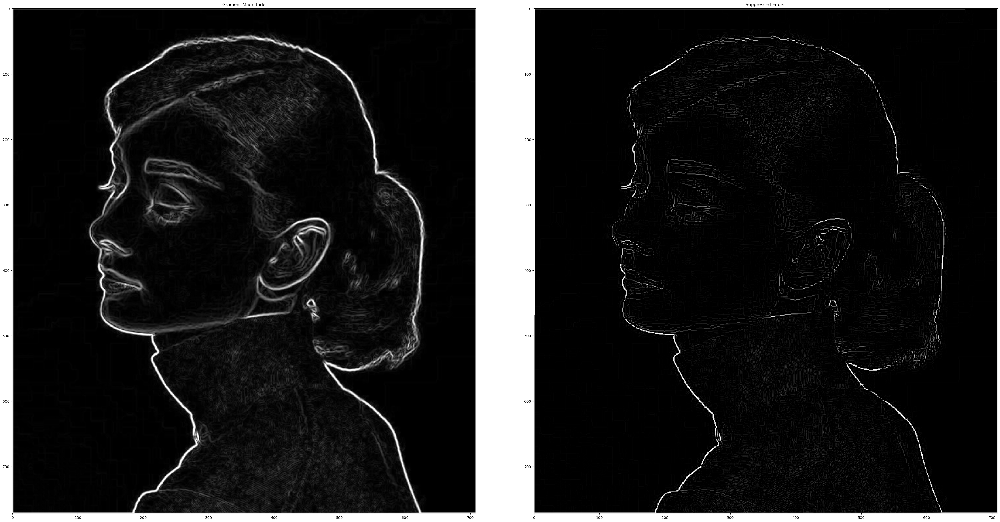

In [87]:
# Perform non-maximum suppression
suppressed = non_max_suppression(gradient_magnitude, gradient_angle)

# Compare original gradient magnitude with suppressed edges
plot_2_fig(gradient_magnitude, suppressed, "Gradient Magnitude", "Suppressed Edges", "gray", 4000, 2000)

## Step 4: Double Thresholding and Edge Tracking

This step applies high and low thresholds to identify strong, weak, and non-edges.

In [88]:
def threshold(gradient_magnitude, low_threshold, high_threshold):
    """
    Apply double thresholding to the gradient magnitude image

    Args:
            gradient_magnitude: numpy array of gradient magnitudes
            low_threshold: low threshold value
            high_threshold: high threshold value

    Returns:
            numpy array of same size as input with thresholding applied
    """
    M, N = gradient_magnitude.shape
    result = np.zeros((M, N), dtype=np.uint8)

    # Define weak and strong pixel values
    weak = 60
    medium = 150
    strong = 255

    # Define the 8-connectivity offsets
    offsets = [
        (-1, -1),
        (-1, 0),
        (-1, 1),
        (0, -1),
        (0, 1),
        (1, -1),
        (1, 0),
        (1, 1),
    ]

    # Initialize the result with strong pixels
    for i in range(M):
        for j in range(N):
            if gradient_magnitude[i, j] >= high_threshold:
                result[i, j] = strong

    # Find weak pixels
    weak_i, weak_j = [], []
    for i in range(M):
        for j in range(N):
            if (
                gradient_magnitude[i, j] >= low_threshold
                and gradient_magnitude[i, j] < high_threshold
            ):
                result[i, j] = weak
                weak_i.append(i)
                weak_j.append(j)
                
		# define a map which map a point to a bool value
    searched = np.ones((M, N), dtype=bool)
    for i, j in zip(weak_i, weak_j):
        searched[i, j] = False
    
    # Check medium pixels, we should convert all those edges which are connected to strong edges to medium edges
    for i, j in zip(weak_i, weak_j):
        if searched[i, j]:
            continue
        searched[i, j] = True
        weak_group = [(i, j)]
        pending_to_change = [(i, j)]
        change_to_medium = False # only when the group is connected to strong edges, we should convert them to medium edges
        while weak_group:
            i, j = weak_group.pop()
            for offset_i, offset_j in offsets:
                new_i, new_j = i + offset_i, j + offset_j
                if 0 <= new_i < M and 0 <= new_j < N:
                    if result[new_i, new_j] == weak and not searched[new_i, new_j]:
                      weak_group.append((new_i, new_j))
                      pending_to_change.append((new_i, new_j))
                      searched[new_i, new_j] = True
                    elif result[new_i, new_j] == strong or result[new_i, new_j] == medium:
                      change_to_medium = True
                      break
            if change_to_medium:
                break
        if change_to_medium:
            for i, j in pending_to_change:
                result[i, j] = medium

    return result

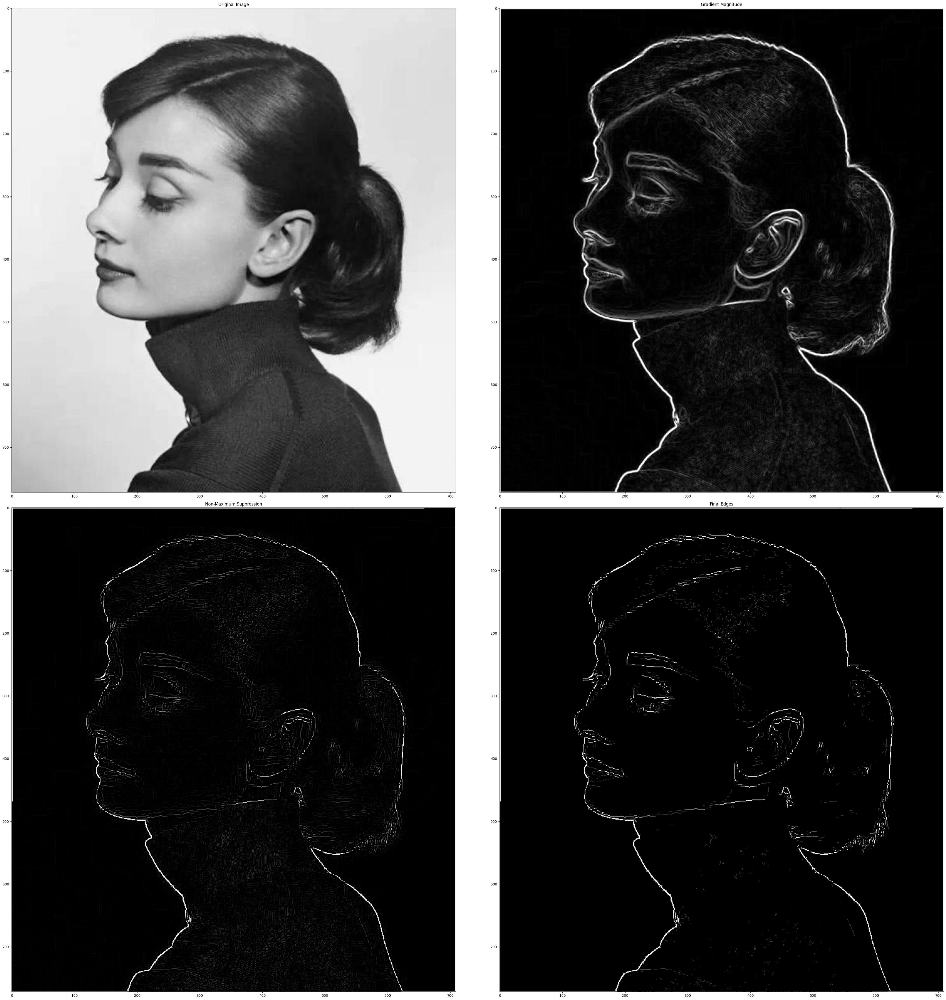

In [89]:
# Apply threshold to get final edges
low_threshold = 50
high_threshold = 100

thresholded = threshold(suppressed, low_threshold, high_threshold)

# Compare all stages
plt.figure(figsize=(40, 40))

plt.subplot(2, 2, 1)
plt.imshow(img, cmap="gray")
plt.title("Original Image")

plt.subplot(2, 2, 2)
plt.imshow(gradient_magnitude, cmap="gray")
plt.title("Gradient Magnitude")

plt.subplot(2, 2, 3)
plt.imshow(suppressed, cmap="gray")
plt.title("Non-Maximum Suppression")

plt.subplot(2, 2, 4)
plt.imshow(thresholded, cmap="gray")
plt.title("Final Edges")

plt.tight_layout()
plt.show()	

## Complete Canny Edge Detection Function

100%|██████████| 772/772 [00:03<00:00, 208.44it/s]


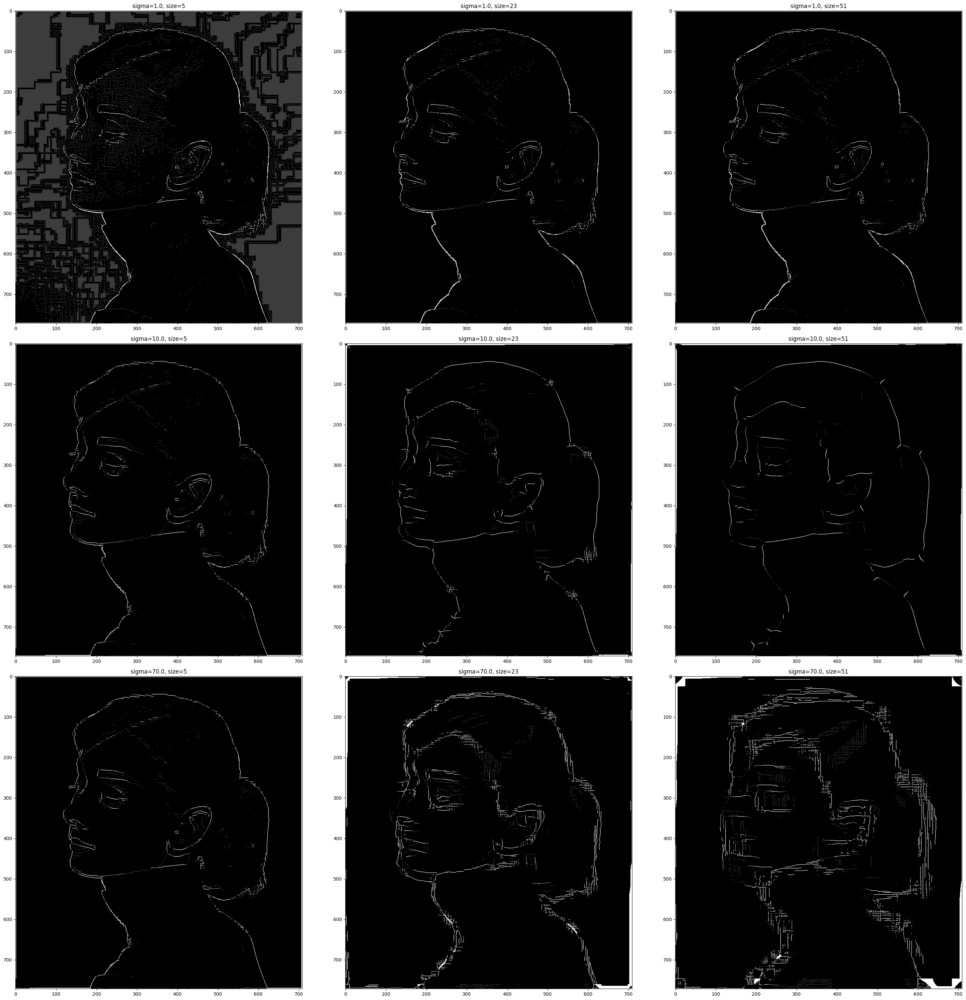

In [ ]:
def complete_canny_edge_detection(
    img, low_threshold=70, high_threshold=125, sigma=10.0, size=5
):
    """Complete Canny edge detection pipeline"""
    gaussian_kernel = generate_gaussian_kernel(size, sigma)
    derivative_x_kernel = np.array([[0, 0, 0], [1, 0, -1], [0, 0, 0]], dtype=np.float32) / 2.0
    derivative_y_kernel = np.array([[0, 1, 0], [0, 0, 0], [0, -1, 0]], dtype=np.float32) / 2.0
    derivative_x_gaussian_kernel = my_conv2d(derivative_x_kernel, gaussian_kernel, conv_type="same")
    derivative_y_gaussian_kernel = my_conv2d(derivative_y_kernel, gaussian_kernel, conv_type="same")


    # 1. Compute gradients
    derivative_x_gaussian_result = my_conv2d(derivative_x_gaussian_kernel, img, conv_type="same")
    derivative_y_gaussian_result = my_conv2d(derivative_y_gaussian_kernel, img, conv_type="same")

    # 2. Calculate gradient magnitude and direction
    gradient_magnitude = np.sqrt(derivative_x_gaussian_result**2 + derivative_y_gaussian_result**2)  
    gradient_magnitude = clip_show(gradient_magnitude)

    gradient_angle = np.arctan2(derivative_y_gaussian_result, derivative_x_gaussian_result)
    gradient_angle = np.degrees(gradient_angle) % 180

    # 3. Non-maximum suppression
    suppressed = non_max_suppression(gradient_magnitude, gradient_angle)

    # 4. Thresholding
    thresholded = threshold(suppressed, low_threshold, high_threshold)
    return thresholded



# Apply the complete function and test for different sigma values

# test sigma from 5.0 to 40.0, size from 5 to 35

low_threshold=50

high_threshold=100

sigmas = [1.0, 10.0, 70.0]

size = [5, 23, 51]

finial_edges = []

for sigma in sigmas:
		for s in size:
				finial_edges.append(complete_canny_edge_detection(img, low_threshold, high_threshold, sigma, s))


# Compare results

# show the size differences in the same row

# show the sigma differences in the same column

plt.figure(figsize=(30, 30))

for i, edge in enumerate(finial_edges):

		plt.subplot(3, 3, i+1)

		plt.imshow(edge, cmap="gray")

		plt.title(f"sigma={sigmas[i//3]}, size={size[i%3]}")

plt.tight_layout()

plt.show()